<a href="https://colab.research.google.com/github/BintangPancahaya/PCVK26_06_BintangPP/blob/main/P2_PCVK_D1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from google.colab import files
uploaded = files.upload()

Saving ktm.jpg to ktm.jpg


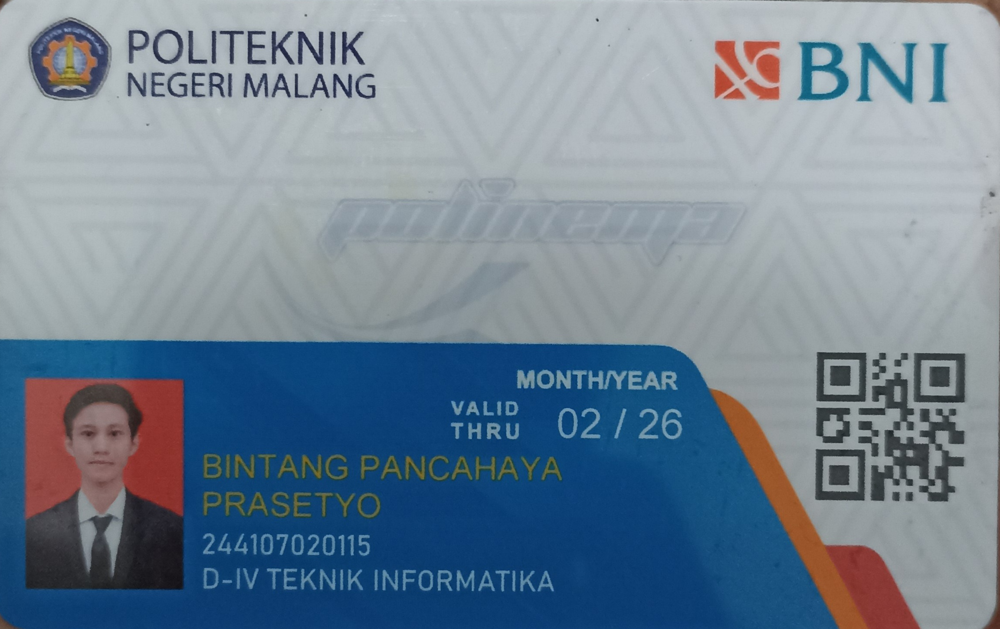

Resolusi gambar:  2305  x  1450


In [51]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['figure.figsize'] = (6, 6)
plt.rcParams['figure.dpi'] = 150

img = cv.imread('ktm.jpg')
cv2_imshow(img)

print("Resolusi gambar: ", img.shape[1], " x ", img.shape[0])

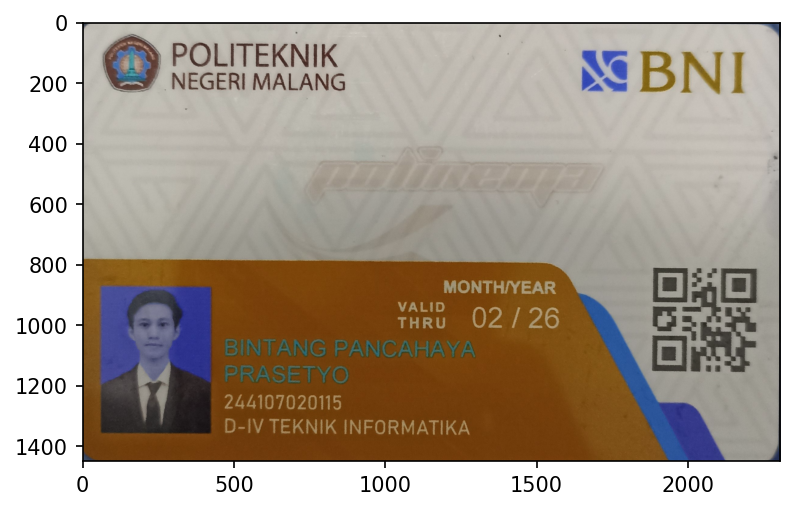

In [50]:
img = cv.imread('ktm.jpg')
plt.imshow(img)

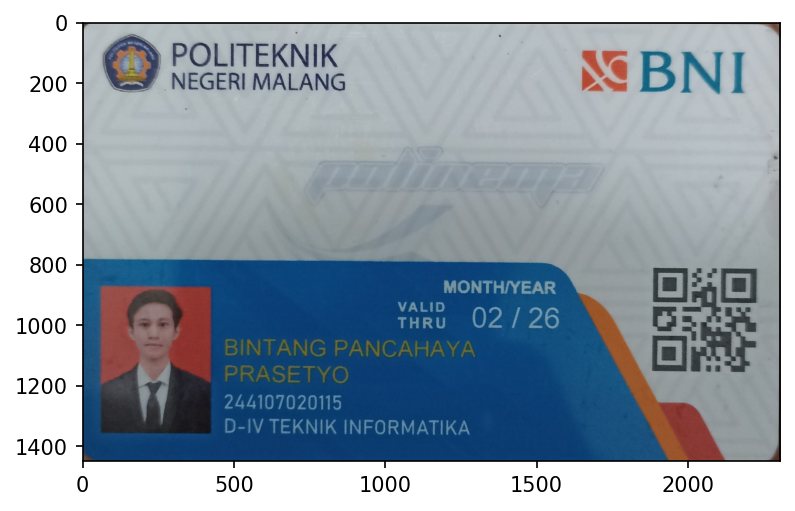

In [49]:
img = cv.imread('ktm.jpg')
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.show()

Text(0.5, 1.0, 'Dengan cmap')

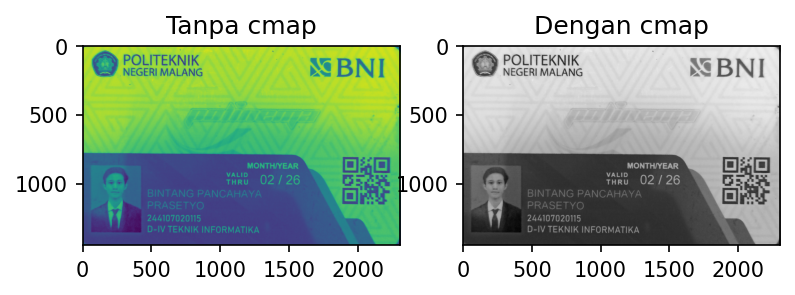

In [48]:
img_gray = cv.imread('ktm.jpg', cv.IMREAD_GRAYSCALE)

plt.subplot(1,2,1)
plt.imshow(img_gray)
plt.title('Tanpa cmap')

plt.subplot(1,2,2)
plt.imshow(img_gray, cmap='gray')
plt.title('Dengan cmap')

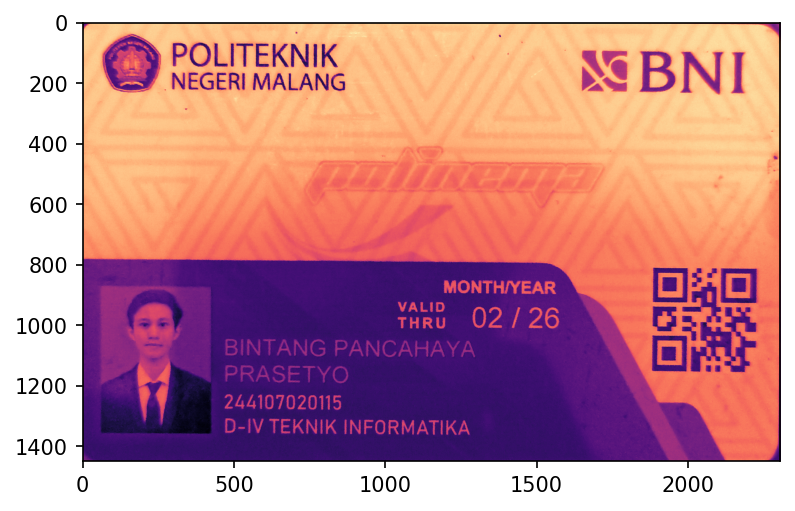

In [47]:
plt.imshow(img_gray, cmap='magma')

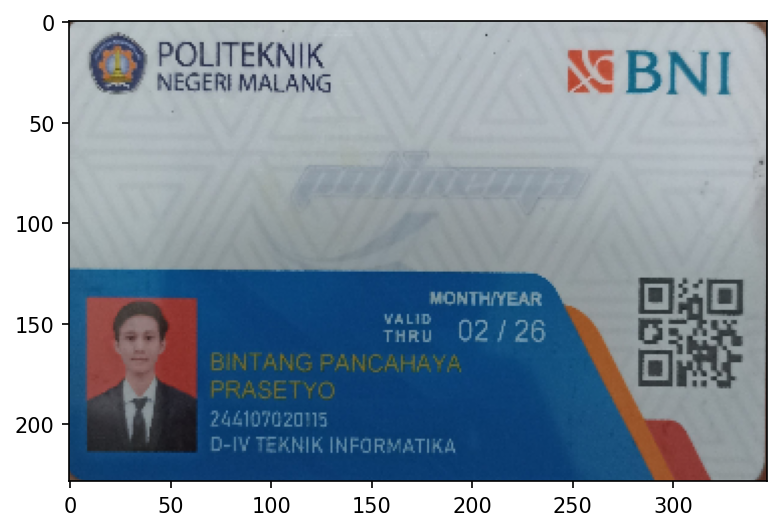

In [46]:
imgRGB = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img_output = cv.resize(imgRGB, (347, 229))
plt.imshow(img_output)

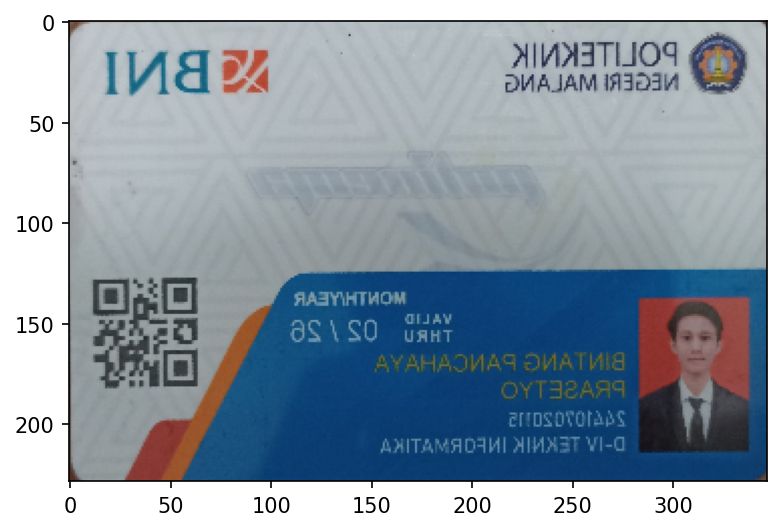

In [45]:
imgFlip = cv.flip(img_output,1)
plt.imshow(imgFlip)

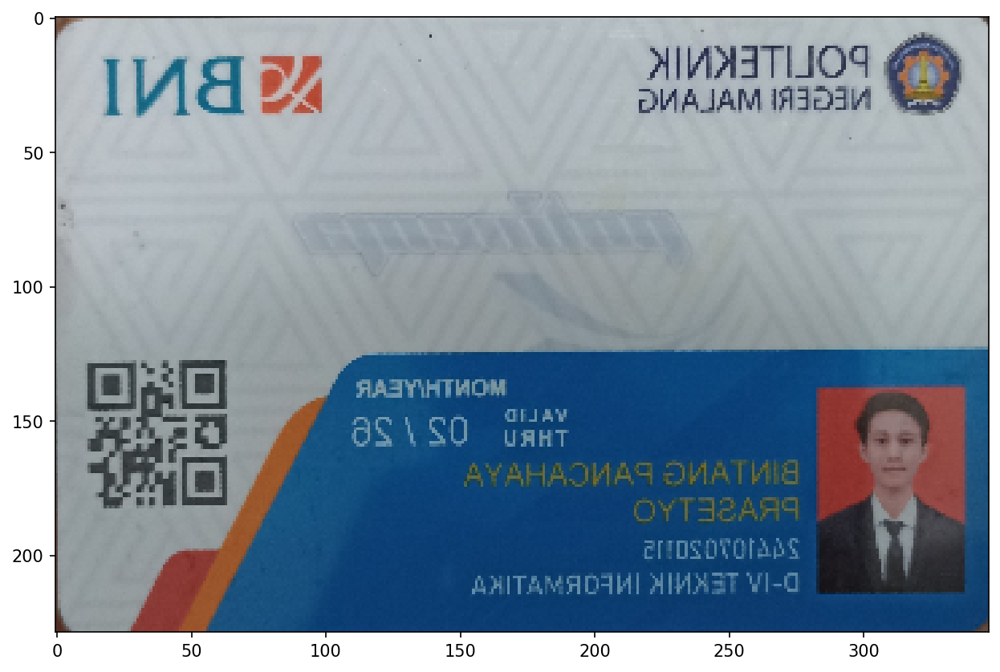

In [44]:
imgFlip = cv.flip(img_output, 1)

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(1,1,1)
ax.imshow(imgFlip)

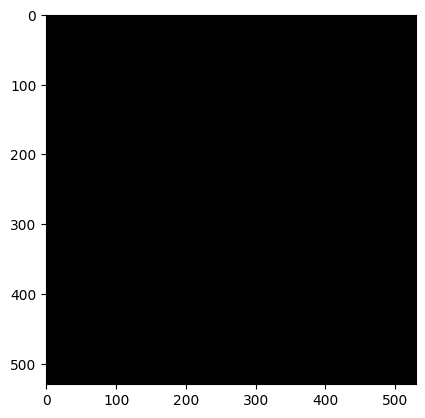

In [12]:
black_img = np.zeros(shape=(530, 530, 3), dtype = np.int16)
plt.imshow(black_img)

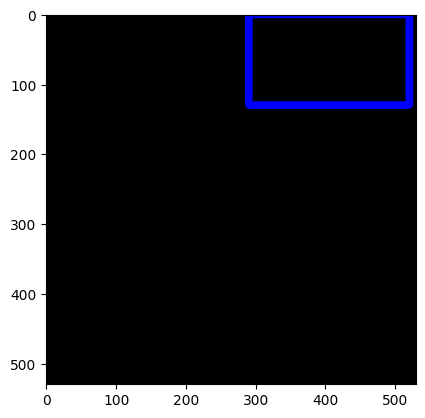

In [13]:
cv.rectangle(black_img, pt1 = (290, 0), pt2 = (520, 130), color = (0, 0, 255), thickness = 10)
plt.imshow(black_img)

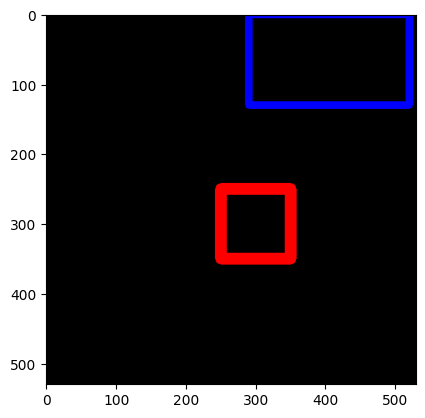

In [14]:
cv.rectangle(black_img, pt1=(250, 250), pt2=(350, 350), color=(255, 0, 0), thickness=15)
plt.imshow(black_img)

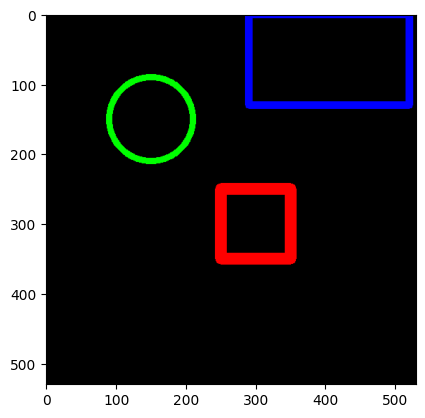

In [15]:
cv.circle(black_img, center=(150, 150), radius=60, color=(0, 255, 0), thickness=8)
plt.imshow(black_img)

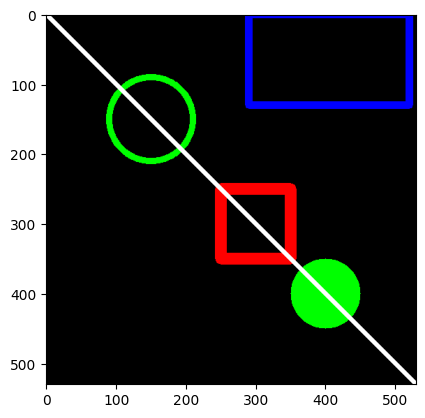

In [16]:
cv.circle(black_img, center=(400, 400), radius=50, color=(0, 255, 0), thickness=-1)
cv.line(black_img, pt1=(0, 0), pt2=(530, 530), color=(255, 255, 255), thickness=5)
plt.imshow(black_img)

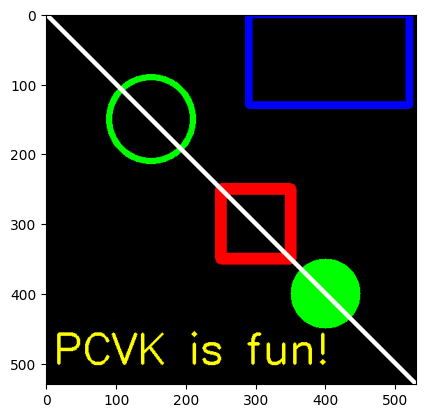

In [17]:
font = cv.FONT_HERSHEY_SIMPLEX
cv.putText(black_img, text='PCVK is fun!', org=(10, 500), fontFace=font, fontScale=2, color=(255, 255, 0), thickness=3, lineType=cv.LINE_AA)
plt.imshow(black_img)

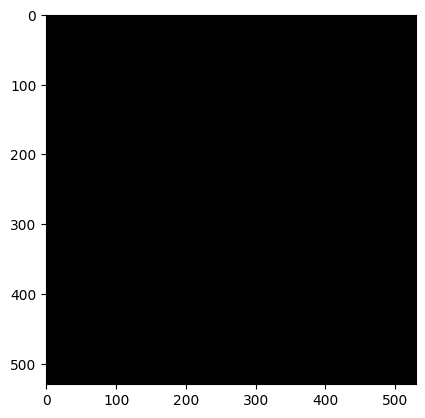

In [18]:
black_img2 = np.zeros(shape=(530, 530, 3), dtype=np.int32)
plt.imshow(black_img2)

In [19]:
vertices = np.array([[150, 350], [250, 250], [450, 350], [250, 450]], dtype=np.int32)
vertices

array([[150, 350],
       [250, 250],
       [450, 350],
       [250, 450]], dtype=int32)

In [20]:
pts = vertices.reshape((-1, 1, 2))  # nilai 2 untuk menunjukkan bahwa tiap titik dibuat 3 channel yg mewakili R, G, dan B
pts

array([[[150, 350]],

       [[250, 250]],

       [[450, 350]],

       [[250, 450]]], dtype=int32)

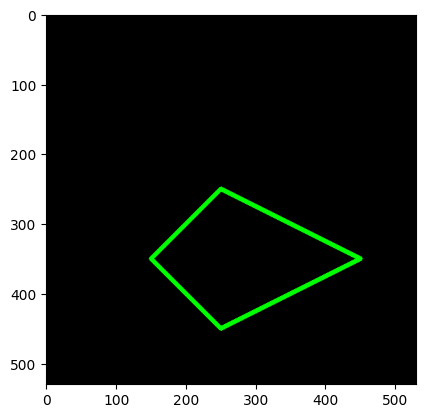

In [21]:
cv.polylines(black_img2, [pts], isClosed=True, color=(0, 255, 0), thickness=5)
plt.imshow(black_img2)

## PERTANYAAN PRAKTIKUM  

1. Tampilkan satu citra bebas menggunakan cv2_imshow() dan plt.imshow()
tanpa konversi warna apa pun. Mengapa hasilnya berbeda? Buktikan dengan
mencetak nilai satu piksel yang sama dari kedua cara pembacaan tersebut.
2. Buat kanvas hitam berukuran sama dengan tipe data int16 dan int32.
Bandingkan dtype, min(), max(), dan nbytes keduanya. Apakah tampilannya
berbeda? Apakah ukuran memorinya berbeda? Jelaskan alasannya.
3. Apa kegunaan baris from google.colab.patches import cv2_imshow, dan
mengapa cv2.imshow() bawaan OpenCV tidak dapat dipakai di Google Colab?
4. Citra yang dibaca dengan skimage.io.imread() ditampilkan berdampingan
dengan hasil cv2.cvtColor(img, cv2.COLOR_BGR2RGB) atas citra yang
sama. Manakah yang menampilkan warna sebenarnya, dan manakah yang
kanalnya tertukar? Buktikan dengan nilai piksel, bukan dengan pengamatan
visual saja.
5. Setelah citra ditampilkan dengan figsize yang jauh lebih besar, apakah nilai
img.shape ikut berubah? Jelaskan perbedaan antara mengubah ukuran citra
dan mengubah ukuran tampilan.

### JAWABAN  

1. Hasilnya berbeda karena cv2.imread() membaca citra dengan urutan kanal BGR, sedangkan plt.imshow() menganggap citra warna memiliki urutan RGB. Jadi, ketika citra dari OpenCV langsung ditampilkan dengan plt.imshow(), warna merah dan biru tertukar.

2. Apakah tampilannya berbeda? Tidak, keduanya sama-sama menampilkan kanvas hitam pekat secara visual.  
Apakah ukuran memorinya berbeda? Ya, berbeda. Kanvas int16 berukuran 750.000 bytes, sedangkan kanvas int32 berukuran 1.500.000 bytes.

3. Digunakan untuk mengimpor fungsi cv2_imshow() yang disediakan khusus oleh Google Colab untuk menampilkan citra OpenCV di dalam notebook.  
cv2.imshow() bawaan OpenCV tidak dapat digunakan secara normal di Google Colab karena fungsi tersebut membutuhkan GUI/window desktop, sedangkan kode Colab dijalankan pada lingkungan notebook yang tidak menyediakan jendela GUI seperti pada komputer lokal.

4. skimage.io.imread() dan cv2.cvtColor(..., BGR2RGB) menghasilkan urutan RGB, sedangkan hasil langsung cv2.imread() menggunakan BGR.

5. Mengubah figsize hanya mengubah ukuran tampilan gambar pada layar, bukan ukuran atau jumlah piksel pada citra.

## Tugas Praktikum - Penerapan  
Tampilkan citra hanya pada kombinasi kanal Merah-Biru dan kanal Hijau- Biru saja, dengan kanal yang tidak dipakai dinolkan. Susun keduanya berdampingan dalam satu figure yang diberi judul.

(np.float64(-0.5), np.float64(2304.5), np.float64(1449.5), np.float64(-0.5))

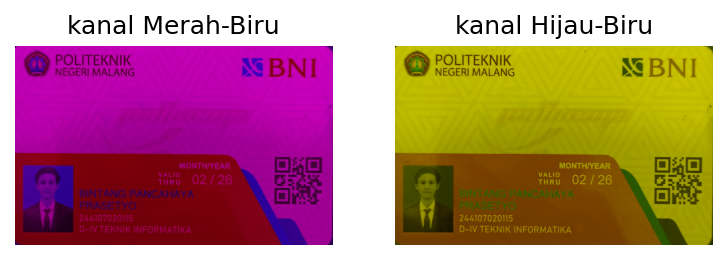

In [43]:
#Tugas Praktikum - Penerapan No 1

img = cv.imread('ktm.jpg')
img_RB = img.copy()
img_RB[:, :, 1] = 0

img_GB = img.copy()
img_GB[:, :, 2] = 0

plt.subplot(1,2,1)
plt.imshow(img_RB)
plt.title('kanal Merah-Biru')
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(img_GB)
plt.title('kanal Hijau-Biru')
plt.axis("off")

2. Tampilkan citra dalam tiga bentuk pencerminan: vertikal, horizontal, dan keduanya, dalam satu figure berisi tiga subplot yang masing-masing diberi label.

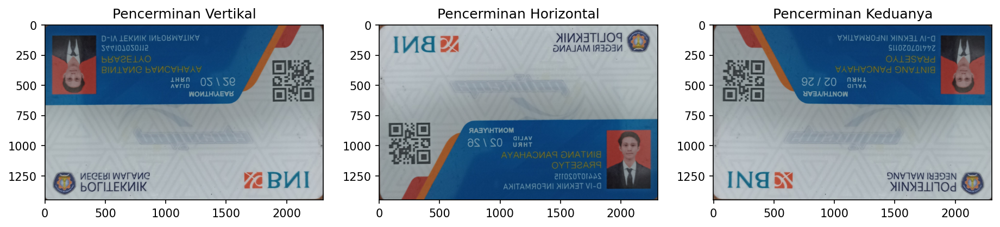

In [42]:
#Tugas Praktikum - Penerapan No 2
img = cv.imread('ktm.jpg')

img_vertikal = cv.flip(img, 0)

img_horizontal = cv.flip(img, 1)

img_keduanya = cv.flip(img, -1)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv.cvtColor(img_vertikal, cv.COLOR_BGR2RGB))
plt.title('Pencerminan Vertikal')

plt.subplot(1, 3, 2)
plt.imshow(cv.cvtColor(img_horizontal, cv.COLOR_BGR2RGB))
plt.title('Pencerminan Horizontal')

plt.subplot(1, 3, 3)
plt.imshow(cv.cvtColor(img_keduanya, cv.COLOR_BGR2RGB))
plt.title('Pencerminan Keduanya')

plt.show()

3. Gambarkan sebuah rectangle dan sebuah circle pada bagian wajah / badan dari foto aktivitas Anda sendiri (bukan pasfoto), lalu tambahkan teks berisi nama Anda dengan pilihan font, ukuran, dan warna yang Anda tentukan sendiri.

In [24]:
from google.colab import files
uploaded = files.upload()

Saving fotobebas.jpg to fotobebas.jpg


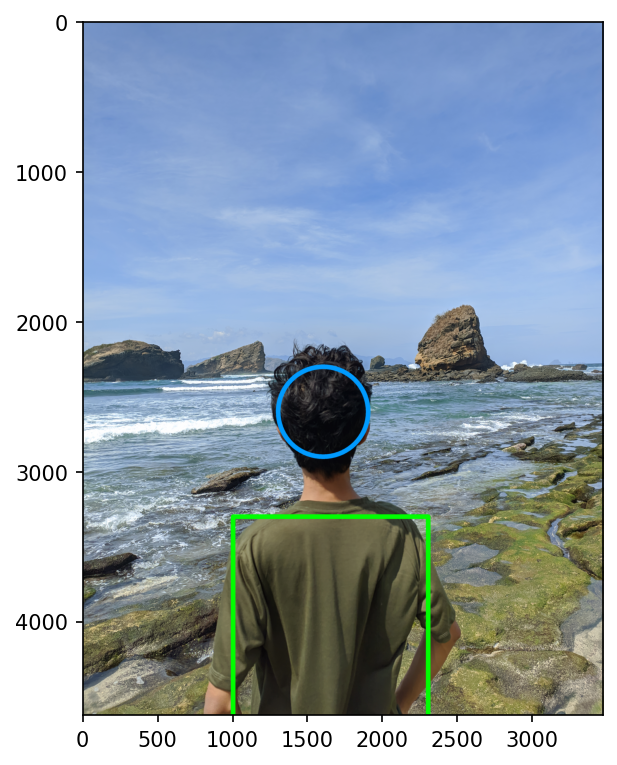

In [41]:
#Tugas Penerapan - No 3
img_prak = cv.imread("fotobebas.jpg")
img_prak = cv.cvtColor(img_prak, cv.COLOR_BGR2RGB)

# Rectangle
cv.rectangle(
    img_prak,
    (1000, 3300),
    (2300, 5000),
    (0, 255, 0),
    30
)

# Circle
cv.circle(
    img_prak,
    (1600, 2600),
    300,
    (0, 155, 255),
    30
)

plt.show()
plt.imshow(img_prak)

## TUGAS PRAKTIKUM - Analisa
1. Rumuskan satu pertanyaan tentang citra digital yang dapat Anda jawab menggunakan kode dari modul ini. Contoh pertanyaan: berapa persen piksel pada foto KTM Anda yang lebih gelap dari nilai 100? apakah mengecilkan lalu membesarkan citra mengubah rata-rata intensitasnya? Tuliskan pertanyaan Anda, rancangan program, data hasilnya, dan kesimpulan Anda.

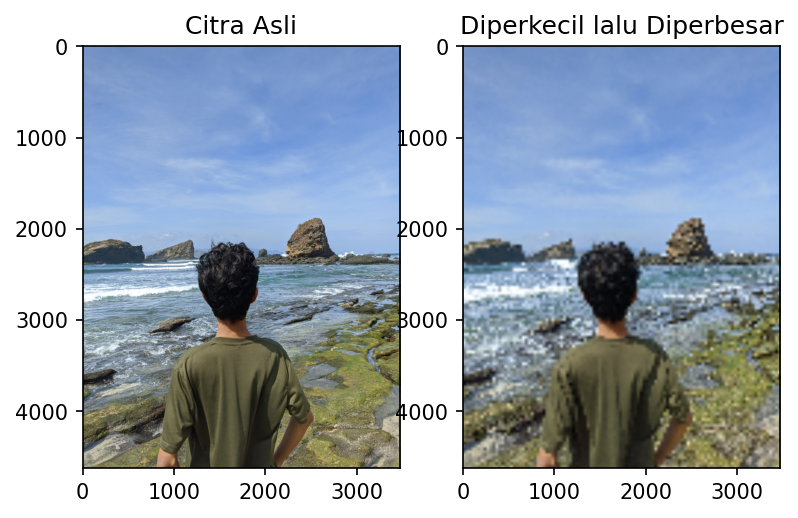

Shape citra asli  : (4624, 3472, 3)
Shape citra balik : (4624, 3472, 3)

Piksel asli pada (100, 100) : [119 147 197]
Piksel balik pada (100, 100): [118 147 199]

Piksel asli pojok kiri atas (0, 0) : [121 149 196]
Piksel balik pojok kiri atas (0, 0): [120 151 199]

Rata-rata selisih nilai piksel (asli vs balik): 11.78685516841936
Selisih piksel maksimum                       : 240


In [40]:
# Tugas Praktikum - Analisa
img3 = cv.imread('fotobebas.jpg')
imgRGB = cv.cvtColor(img3, cv.COLOR_BGR2RGB)

# perkecil jauh lebih kecil, lalu besarkan lagi ke ukuran semula
tinggi, lebar = imgRGB.shape[0], imgRGB.shape[1]
img_kecil  = cv.resize(imgRGB, (lebar//32, tinggi//32))
img_balik  = cv.resize(img_kecil, (lebar, tinggi))

plt.subplot(1, 2, 1)
plt.imshow(imgRGB)
plt.title('Citra Asli')

plt.subplot(1, 2, 2)
plt.imshow(img_balik)
plt.title('Diperkecil lalu Diperbesar')

plt.show()

print("Shape citra asli  :", imgRGB.shape)
print("Shape citra balik :", img_balik.shape)
print()
print("Piksel asli pada (100, 100) :", imgRGB[100, 100])
print("Piksel balik pada (100, 100):", img_balik[100, 100])
print()
print("Piksel asli pojok kiri atas (0, 0) :", imgRGB[0, 0])
print("Piksel balik pojok kiri atas (0, 0):", img_balik[0, 0])
print()

selisih = np.abs(imgRGB.astype(int) - img_balik.astype(int))
print("Rata-rata selisih nilai piksel (asli vs balik):", selisih.mean())
print("Selisih piksel maksimum                       :", selisih.max())

### Kesimpulan  
cv2.resize() untuk memperkecil lalu memperbesar kembali tidak mengubah ukuran (shape) citra shape citra asli dan citra hasil balik tetap sama persis. Namun nilai piksel per piksel berbeda, terbukti dari perbandingan piksel di titik (100, 100) maupun di pojok (0, 0) antara citra asli dan citra hasil balik, serta rata-rata selisih yang tidak nol. Ini terjadi karena saat citra diperkecil, banyak piksel tetangga digabung/dirata-ratakan menjadi satu piksel (informasi hilang secara permanen), lalu saat diperbesar kembali, piksel-piksel baru hanya diperkirakan (interpolasi) dari piksel-piksel yang tersisa bukan dikembalikan ke nilai aslinya. Itulah sebabnya citra hasilnya terlihat lebih buram meskipun ukurannya sama dengan citra asli.

## TUGAS PRAKTIKUM - Aplikasi  
Studi Kasus 1: Panitia sebuah kegiatan perlu membubuhkan label identitas pada ratusan foto dokumentasi. Foto berasal dari beberapa kamera dan ponsel, sehingga ukurannya bermacam-macam. Label harus terlihat seimbang pada semua foto tanpa disetel satu per satu. Fungsi yang sama dikenakan pada dua citra berbeda ukuran. Tinggi bar dan ukuran huruf ikut menyesuaikan, sehingga proporsinya tetap sama. Silakan melakukan akuisisi data sendiri, setiap anak harus menggunakan image yang berbeda-beda

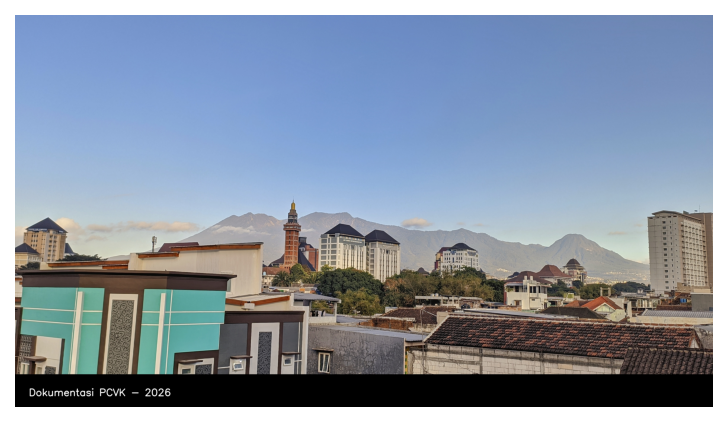

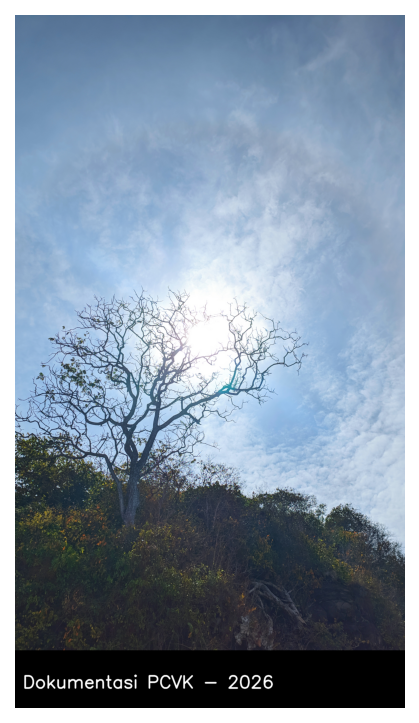

In [38]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['figure.figsize'] = (6, 6)
plt.rcParams['figure.dpi'] = 150


def tambah_label(img_label):
  h, w = img_label.shape[:2]

  tinggi_bar = int(h / 12)

  ukuran_huruf = h / 1200
  ketebalan = max(1, int(h / 500))

  cv.rectangle(img_label, (0, h - tinggi_bar), (w, h), (0, 0, 0), -1)

  cv.putText(
      img_label,
      'Dokumentasi PCVK - 2026',
      (int(w * 0.02), h - int(tinggi_bar * 0.35)),
      cv.FONT_HERSHEY_SIMPLEX,
      ukuran_huruf,
      (255, 255, 255),
      ketebalan,
      lineType=cv.LINE_AA,
  )

  return img_label


foto1 = cv.imread('/content/drive/MyDrive/Modul2PCVK/sky.jpeg')
foto2 = cv.imread('/content/drive/MyDrive/Modul2PCVK/sky2.jpg')

hasil1 = tambah_label(foto1)
hasil2 = tambah_label(foto2)

plt.figure()
plt.imshow(cv.cvtColor(hasil1, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

plt.figure()
plt.imshow(cv.cvtColor(hasil2, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

Studi Kasus 2: Marketplace seperti Tokopedia dan Shopee menampilkan foto produk dalam bingkai persegi 1:1. Foto penjual yang berukuran potrait atau lanskap akan terpotong atau terlihat tidak proporsional bila diunggah begitu saja. Bangun program yang mengubah foto berukuran apa pun menjadi thumbnail persegi tanpa mengubah rasio aslinya, dengan sisa ruang diisi kanvas berwarna. Dalam hal ini, rasio asli tetap terjaga, citra terpasang tepat di tengah kanvas, tambahkan logo nama toko berukuran proporsional pada gambar.

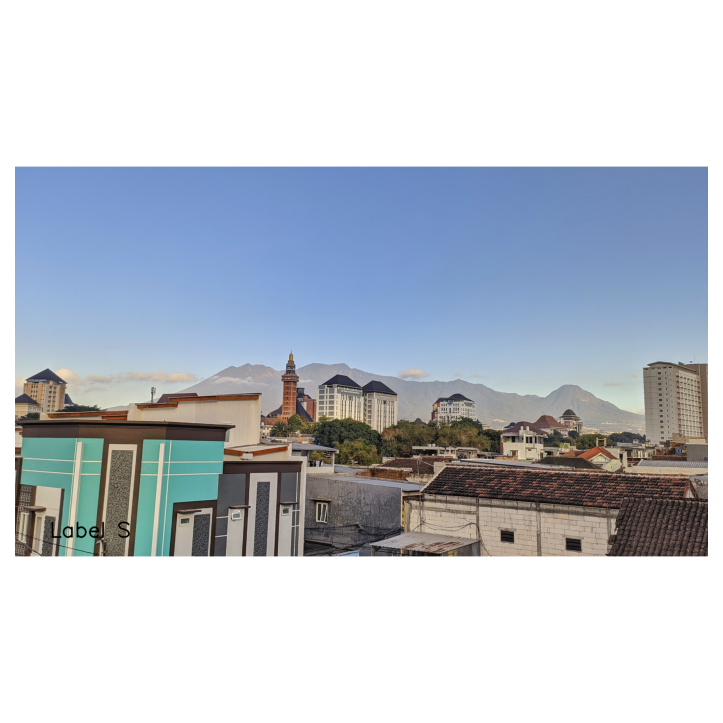

In [37]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['figure.figsize'] = (6, 6)
plt.rcParams['figure.dpi'] = 150

img = cv.imread('/content/drive/MyDrive/Modul2PCVK/sky.jpeg')

h, w = img.shape[:2]

ukuran = max(h, w)

canvas = np.full((ukuran, ukuran, 3), 255, dtype=np.uint8)

if w > h:
  lebar = ukuran
  tinggi = int(h * ukuran / w)
else:
  tinggi = ukuran
  lebar = int(w * ukuran / h)

img_resize = cv.resize(img, (lebar, tinggi), interpolation=cv.INTER_AREA)

x = (ukuran - lebar) // 2
y = (ukuran - tinggi) // 2

canvas[y : y + tinggi, x : x + lebar] = img_resize

ukuran_font = ukuran / 1000
ketebalan = max(1, int(ukuran / 500))

pos_x = x + int(lebar * 0.05)
pos_y = y + tinggi - int(tinggi * 0.05)

cv.putText(
    canvas,
    'Label S',
    (pos_x, pos_y),
    cv.FONT_HERSHEY_SIMPLEX,
    ukuran_font,
    (0, 0, 0),
    ketebalan,
    lineType=cv.LINE_AA,
)

canvas_rgb = cv.cvtColor(canvas, cv.COLOR_BGR2RGB)

plt.imshow(canvas_rgb)
plt.axis('off')
plt.show()